# ChIP-seq

# Introduction

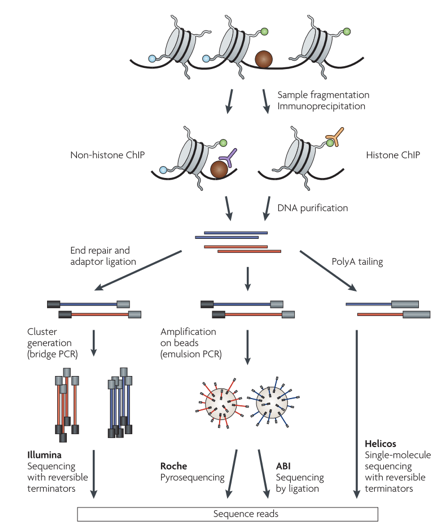
ChIP-seq is used to map the location of proteins on DNA/chromatin, such as transcription factors (non-histone-ChIP) or modified histones (histone-ChIP). Precipitated fragments are sequenced using next-generation sequencing. For more info, see the review paper by Park et al., in Nature Reviews Genetics, 2009. https://www.nature.com/articles/nrg2641

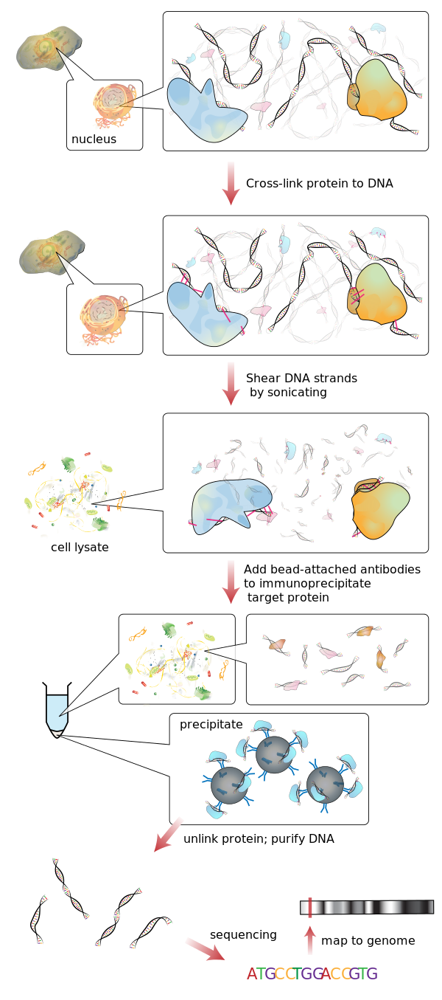
Here's another illustration - from Wikipedia, see https://en.wikipedia.org/wiki/ChIP-sequencing

### Data from GEO

In this lesson we will analyze ChIP-seq data to identify binding sites of TP53. ChIP was performed in MCF-7 cells, after treatment with nutlin-3a, using an antibody against TP53. The original data at GEO is here https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE47041. 

### To download the raw FASTQ files from SRA (starting from a GEO entry):
If you follow the link to SRA you will find each run as a separate SRR entry, for example the nutlin-3a treates cells (S = "Stimulated") are here: https://www.ncbi.nlm.nih.gov/sra?term=SRX285808. On that page, you will find the SRR ID of that sequencing run, which is SRR866627. 

In a Bash cell, download the FASTQ data using the SRA-toolbox command `fastq-dump`.
For example this will download the entire FASTQ file:
`fastq-dump -O /mnt/storage/$USER/ SRR866627`



Test fastq-dump to see if it finds the SRR data; just retrieve a couple of reads (-X 5), and write to standard out (-Z)

In [1]:
fastq-dump -X 5 -Z SRR866627

Read 5 spots for SRR866627
Written 5 spots for SRR866627
@SRR866627.1 HWI-ST571:161:D0YP4ACXX:3:1101:1437:2055 length=51
NCGAAAGACTGCTGGCCGACGTCGAGGTCCCGATTGTCGGCGTCGGCGGCA
+SRR866627.1 HWI-ST571:161:D0YP4ACXX:3:1101:1437:2055 length=51
#1:AABDDH<?CF<CFHH@D:??FAEE6?FHDAA=@CF@4@EBA88@;575
@SRR866627.2 HWI-ST571:161:D0YP4ACXX:3:1101:1423:2163 length=51
GAAATACTGTCTCTACTAAAAATACAAAAAGTAGCCAGGCGTCGTGGTGCA
+SRR866627.2 HWI-ST571:161:D0YP4ACXX:3:1101:1423:2163 length=51
B@CFFFFFHHHHGIJJJJIJJJIJJJJIJJIEGHIJJJJIJIIIHIE=FGC
@SRR866627.3 HWI-ST571:161:D0YP4ACXX:3:1101:1534:2014 length=51
NGATCGGAAGAGCACACGTCTGAACTCCAGTCACGTGGCCTTATCTCGTAT
+SRR866627.3 HWI-ST571:161:D0YP4ACXX:3:1101:1534:2014 length=51
#1:DDDFFHFDHFEGIFDGGCDHIGIIEGHDGGGDHGIIJJJIGHIG>GHI
@SRR866627.4 HWI-ST571:161:D0YP4ACXX:3:1101:1517:2238 length=51
TTTGTCTAGGAAATAACCGTCAGGATTGACACCCTCCCAATTGTATGTTTT
+SRR866627.4 HWI-ST571:161:D0YP4ACXX:3:1101:1517:2238 length=51
@CCFFFFFHHHHHJJJJJJGIJJJJJJJJIJJJJIJJJHGIIJHIIIFIII
@SRR866627.5 HW

To download the entire data set, you can do the following: 
Be careful, this takes a lot of space. After mapping, immediatly delete the fastq files !!

In [2]:
#fastq-dump -O /mnt/storage/u0038182/jupyternotebooks/chipseq SRR866627

### Use the ChIP-seq data for the p53 case study directly from the linux server 
For the exercise in class, we have extracted all the reads that map to <b>chromosome 19</b>, the FASTQ file with that subset of reads can be found here: /mnt/storage/data/chipseq/p53/. You can create a symbolic link to the .fastq files in that folder (do not copy them to your folders !). 


### Data from ChIP-atlas.org

You can also find this data set at http://chip-atlas.org/view?id=SRX285808

There you can also download the bigWig file (see further below) and the BED file with the peaks (see further below).
For the raw data, chip-atlas.org links to the SRA.

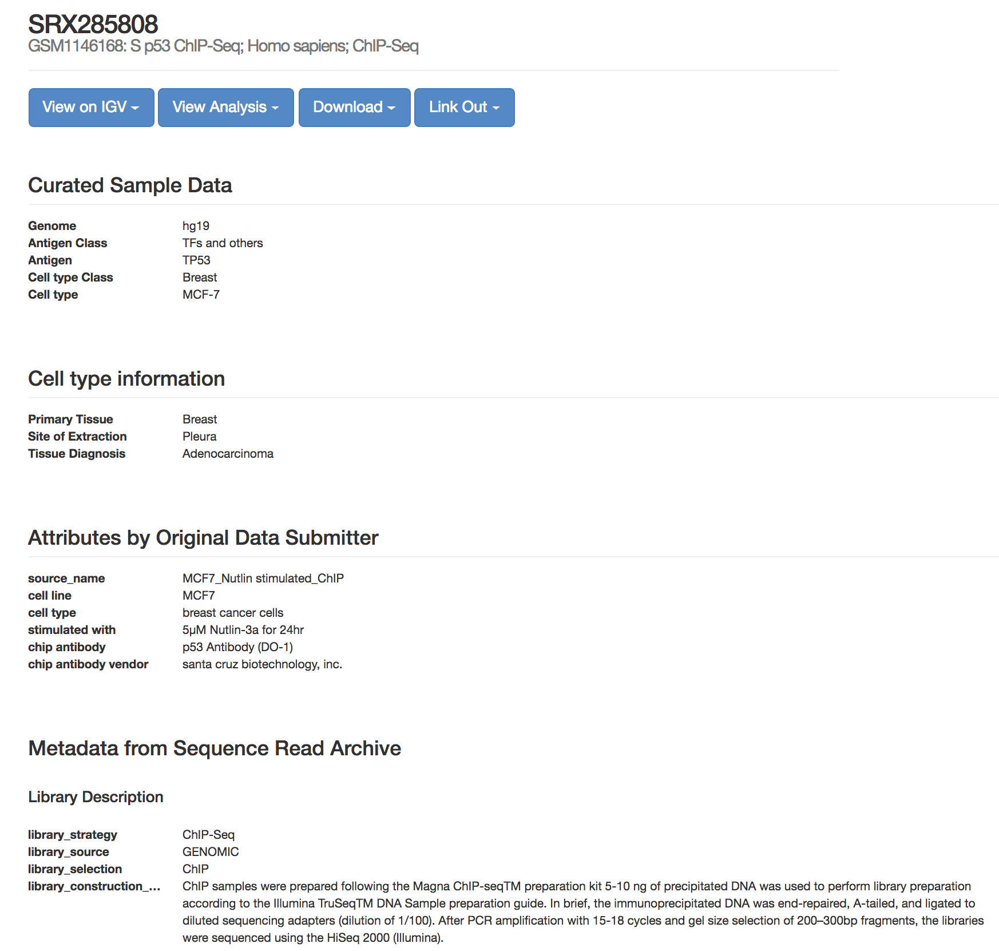

### Data from ReMap

The data set is also in ReMap, but there you can only download the peak files. 
They do provide a link to the GEO page, from where you can get to SRA to the raw data.

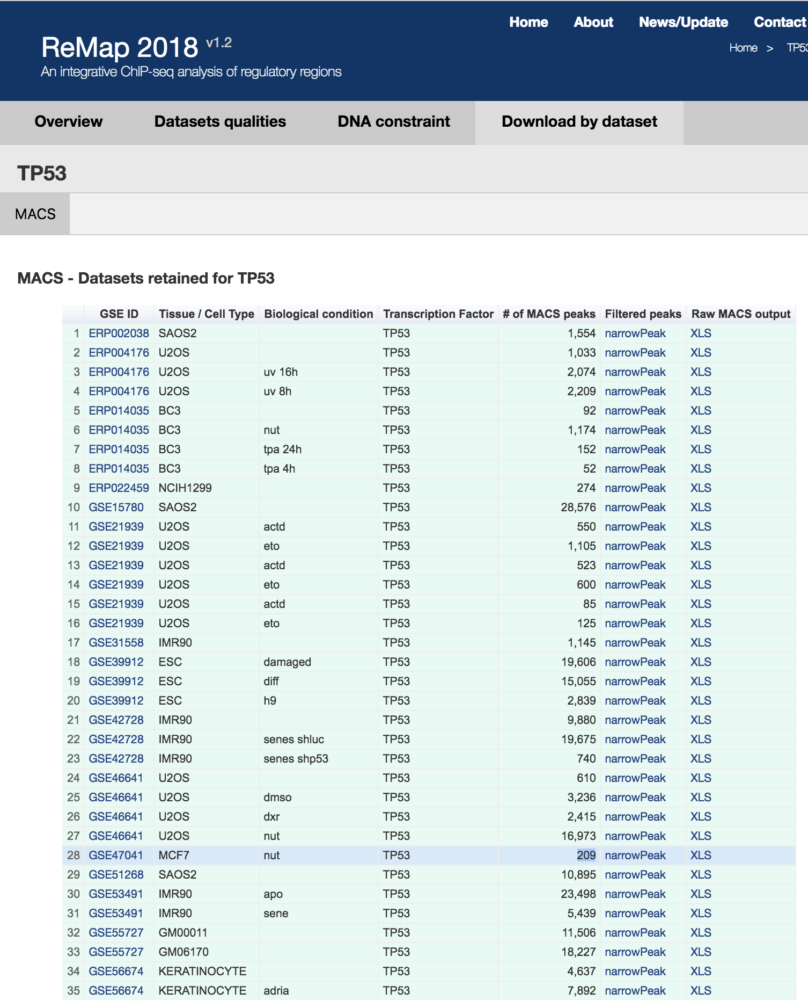

### For more information about ChIP-seq data analysis:
* https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3828144/
* https://github.com/crazyhottommy/ChIP-seq-analysis
* http://www.biologie.ens.fr/~mthomas/other/chip-seq-training/
* http://dputhier.github.io/EBA_2015_ChIP-Seq/slides/chipseq_CarlHerrmann_Roscoff2015.pdf

First we will set the directory where we will work, and cd into that directory

In [3]:
mkdir -p /mnt/storage/$USER/jupyternotebooks/chipseq/
cd /mnt/storage/$USER/jupyternotebooks/chipseq/

For the exercise in class, you can create a symbolic link to the FASTQ files in this directory: /mnt/storage/data/chipseq/p53/. This will avoid copying the same file for every student

In [4]:
ln -sf /mnt/storage/data/chipseq/p53/*.fastq .

In [5]:
ls -lt *.fastq

lrwxrwxrwx 1 u0038182 domain users 57 Sep 25 15:41 ChIP_input_MCF7-chr19.fastq -> /mnt/storage/data/chipseq/p53/ChIP_input_MCF7-chr19.fastq
lrwxrwxrwx 1 u0038182 domain users 50 Sep 25 15:41 ChIP_p53_chr19.fastq -> /mnt/storage/data/chipseq/p53/ChIP_p53_chr19.fastq


The ls -l command shows the listing of files in the current directory. You can see one link, to the fastq file with reads that map onto chr19

## Check read quality

In [6]:
fastqc ChIP_p53_chr19.fastq

Started analysis of ChIP_p53_chr19.fastq
Approx 5% complete for ChIP_p53_chr19.fastq
Approx 10% complete for ChIP_p53_chr19.fastq
Approx 15% complete for ChIP_p53_chr19.fastq
Approx 20% complete for ChIP_p53_chr19.fastq
Approx 25% complete for ChIP_p53_chr19.fastq
Approx 30% complete for ChIP_p53_chr19.fastq
Approx 35% complete for ChIP_p53_chr19.fastq
Approx 40% complete for ChIP_p53_chr19.fastq
Approx 45% complete for ChIP_p53_chr19.fastq
Approx 50% complete for ChIP_p53_chr19.fastq
Approx 55% complete for ChIP_p53_chr19.fastq
Approx 60% complete for ChIP_p53_chr19.fastq
Approx 65% complete for ChIP_p53_chr19.fastq
Approx 70% complete for ChIP_p53_chr19.fastq
Approx 75% complete for ChIP_p53_chr19.fastq
Approx 80% complete for ChIP_p53_chr19.fastq
Approx 85% complete for ChIP_p53_chr19.fastq
Approx 90% complete for ChIP_p53_chr19.fastq
Approx 95% complete for ChIP_p53_chr19.fastq
Analysis complete for ChIP_p53_chr19.fastq


In [7]:
ls -lt | head

total 1212
-rw-r--r-- 1 u0038182 domain users 742865 Sep 25 15:42 ChIP_p53_chr19_fastqc.html
-rw-r--r-- 1 u0038182 domain users 493102 Sep 25 15:42 ChIP_p53_chr19_fastqc.zip
lrwxrwxrwx 1 u0038182 domain users     57 Sep 25 15:41 ChIP_input_MCF7-chr19.fastq -> /mnt/storage/data/chipseq/p53/ChIP_input_MCF7-chr19.fastq
lrwxrwxrwx 1 u0038182 domain users     50 Sep 25 15:41 ChIP_p53_chr19.fastq -> /mnt/storage/data/chipseq/p53/ChIP_p53_chr19.fastq


Copy the `ChIP_p53_chr19_fastqc.zip` file to your computer, extract it, and open `fastqc_report.html`. For this data set, the sequencing quality scores are very good.

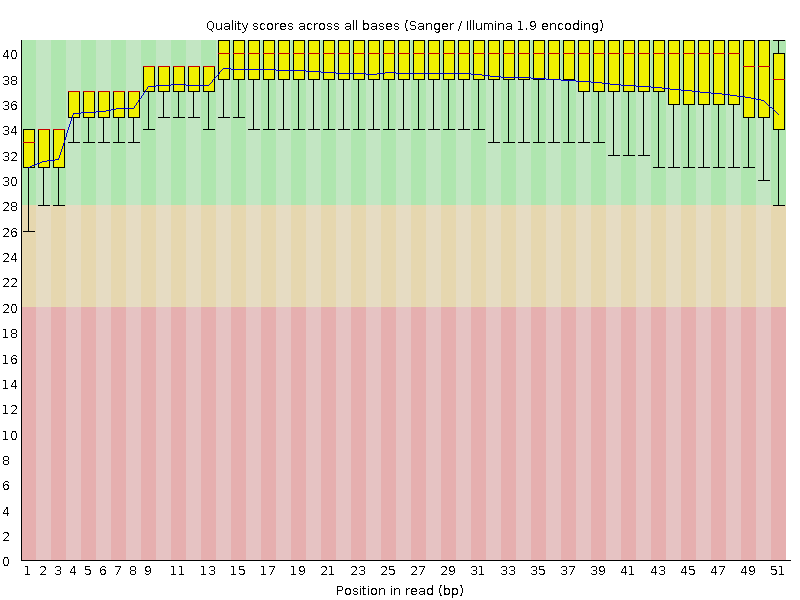

## Alignment of p53 ChIP-seq reads

To align the reads to the genome, we will use bowtie2. As reference genome, you can use the whole genome bowtie index at this location /mnt/storage/data/resources/bowtie2. Alternatively, you can use bwa-mem to align reads. Here we will align to hg19 human assembly. 

In [8]:
bowtie2 -x /mnt/storage/data/resources/bowtie2/hg19 ChIP_p53_chr19.fastq -S ChIP_p53.sam

177768 reads; of these:
  177768 (100.00%) were unpaired; of these:
    2586 (1.45%) aligned 0 times
    144303 (81.17%) aligned exactly 1 time
    30879 (17.37%) aligned >1 times
98.55% overall alignment rate


Check a couple of lines in the SAM file

In [9]:
head -500 ChIP_p53.sam | tail -5

HWI-ST571:161:D0YP4ACXX:4:1209:16161:41710	0	chr19	406092	42	51M	*	0	0	AAAGGCCATAGCCAGGTCCCCCCAGCTGCCTCCTGGGCTCCGACCCACCCA	@@@BB;DD?FDH?@E9?DGCGBEGFB*:BDGGDDB?@@BDB:@GF@=?E=?	AS:i:0	XN:i:0	XM:i:0	XO:i:0	XG:i:0	NM:i:0	MD:Z:51	YT:Z:UU
HWI-ST571:161:D0YP4ACXX:3:1302:7562:88528	0	chr19	406092	42	51M	*	0	0	AAAGGCCATAGCCAGGTCCCCCCAGCTGCCTCCTGGGCTCCGACCCACCCA	CCCFFFFFHGHHHJJJHIJJJJIJIIJJJJJJJJJJJIIJIJJIIGIHHHF	AS:i:0	XN:i:0	XM:i:0	XO:i:0	XG:i:0	NM:i:0	MD:Z:51	YT:Z:UU
HWI-ST571:161:D0YP4ACXX:3:1307:18386:35231	0	chr19	406092	42	51M	*	0	0	AAAGGCCATAGCCAGGTCCCCCCAGCTGCCTCCTGGGCTCCGACCCACCCA	@C@FDFFFHHHHGGHGCGIIJJHIIIJJJEHHIEIIIEIIGGGIJJJHHFB	AS:i:0	XN:i:0	XM:i:0	XO:i:0	XG:i:0	NM:i:0	MD:Z:51	YT:Z:UU
HWI-ST571:161:D0YP4ACXX:4:1302:10890:10304	0	chr19	406239	42	51M	*	0	0	GGGGTGGCAGCCCCCAGCGAGGACGGATGGGCCATAGGGCTGCTCTCTGGG	CCCFDFFFHHGHHJJJJIJGIIHJJJJIIJI(BEHIIHHHHFFFFFEEEEE	AS:i:0	XN:i:0	XM:i:0	XO:i:0	XG:i:0	NM:i:0	MD:Z:51	YT:Z:UU
HWI-ST571:161:D0YP4ACXX:4:1111:10152:3292	0	chr19	406480	42	51M	*	0	0

Convert the SAM file to BAM format (binary)

In [10]:
samtools view -S -b ChIP_p53.sam > ChIP_p53.bam

How many reads are in the BAM file?


In [11]:
samtools view -c ChIP_p53.bam

177768


How many of these reads are mapped?

You can use the option `-F 260` to only output reads that are not unmapped (`UNMAP: 0x4 = 4` is not set) and only primary alignment (`SECONDARY: 0x100 = 256` is not set) see http://samtools.sourceforge.net/samtools.shtml

Here you can decode SAM Flags http://broadinstitute.github.io/picard/explain-flags.html


In [12]:
# List all SAM flags.
samtools flags


About: Convert between textual and numeric flag representation
Usage: samtools flags INT|STR[,...]

Flags:
	0x1	PAIRED        .. paired-end (or multiple-segment) sequencing technology
	0x2	PROPER_PAIR   .. each segment properly aligned according to the aligner
	0x4	UNMAP         .. segment unmapped
	0x8	MUNMAP        .. next segment in the template unmapped
	0x10	REVERSE       .. SEQ is reverse complemented
	0x20	MREVERSE      .. SEQ of the next segment in the template is reversed
	0x40	READ1         .. the first segment in the template
	0x80	READ2         .. the last segment in the template
	0x100	SECONDARY     .. secondary alignment
	0x200	QCFAIL        .. not passing quality controls
	0x400	DUP           .. PCR or optical duplicate
	0x800	SUPPLEMENTARY .. supplementary alignment



In [13]:
# Get correct flag settings for samtools view (second column).
samtools flags UNMAP,SECONDARY

0x104	260	UNMAP,SECONDARY


In [14]:
# Number of mapped reads.
samtools view -c -F 260 ChIP_p53.bam

175182


Now we are going to create the .bai index so we can use the BAM file in IGV

In [15]:
samtools sort -O bam -o ChIP_p53.sorted.bam ChIP_p53.bam

In [16]:
samtools index ChIP_p53.sorted.bam

In [17]:
ls

ChIP_input_MCF7-chr19.fastq  ChIP_p53_chr19_fastqc.zip
ChIP_p53.bam                 ChIP_p53.sam
ChIP_p53_chr19.fastq         ChIP_p53.sorted.bam
ChIP_p53_chr19_fastqc.html   ChIP_p53.sorted.bam.bai


## Check your BAM file in IGV

Copy the `ChIP_p53.sorted.bam` and `ChIP_p53.sorted.bam.bai` to your computer and open them with IGV. Go to `BBC3` (type the gene name in the search box and press "Go"). BBC3 is a target gene of TP53, located on chr19. You will see an enrichment of reads, a "peak" in the first intron of BBC3.


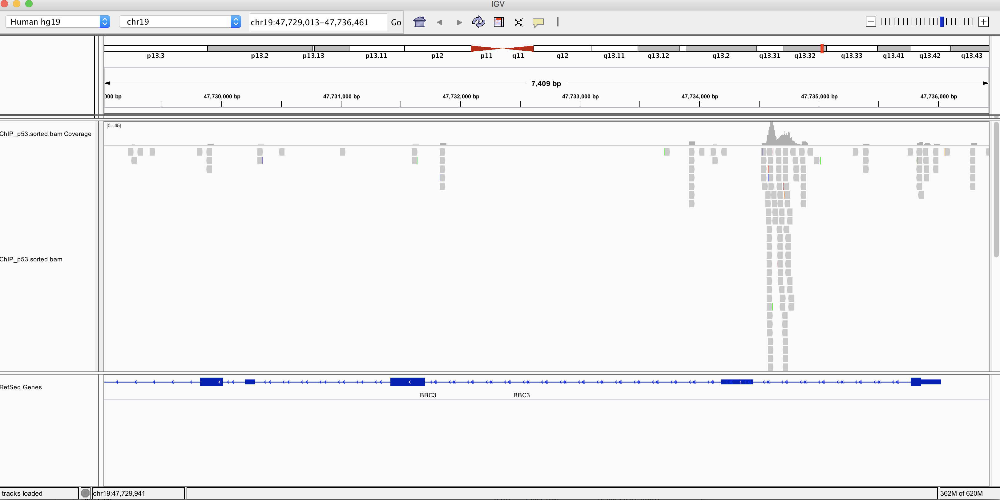

## The BAM file of the whole genome

We have aligned all the FASTQ reads to the genome. The resulting BAM file is here:
* on the linux server: `/mnt/storage/data/chipseq/p53/p53-full.bam`
* on the website: http://students.aertslab.org/p53-full.bam 

You can load this `p-53-full.bam` file in IGV, directly using the URL, by choosing File-Load From Url.
The bottom track is the `p53-full.bam` file. This way you can verify your alignment, is should be similar (not necessarily identical).

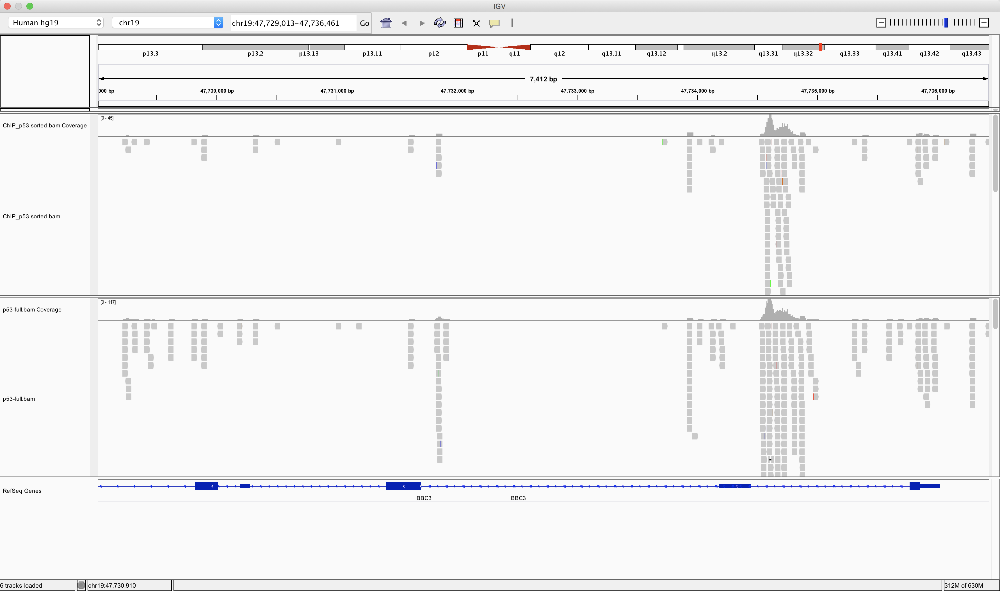

## Alignment of the control data ("input")

In [18]:
bowtie2 -x /mnt/storage/data/resources/bowtie2/hg19 ChIP_input_MCF7-chr19.fastq -S ChIP_input_MCF7-chr19.sam

334156 reads; of these:
  334156 (100.00%) were unpaired; of these:
    10685 (3.20%) aligned 0 times
    207768 (62.18%) aligned exactly 1 time
    115703 (34.63%) aligned >1 times
96.80% overall alignment rate


In [19]:
samtools view -S -b ChIP_input_MCF7-chr19.sam > ChIP_input_MCF7-chr19.bam

In [20]:
samtools sort -O bam -o ChIP_input_MCF7-chr19.sorted.bam ChIP_input_MCF7-chr19.bam

In [21]:
samtools index ChIP_input_MCF7-chr19.sorted.bam

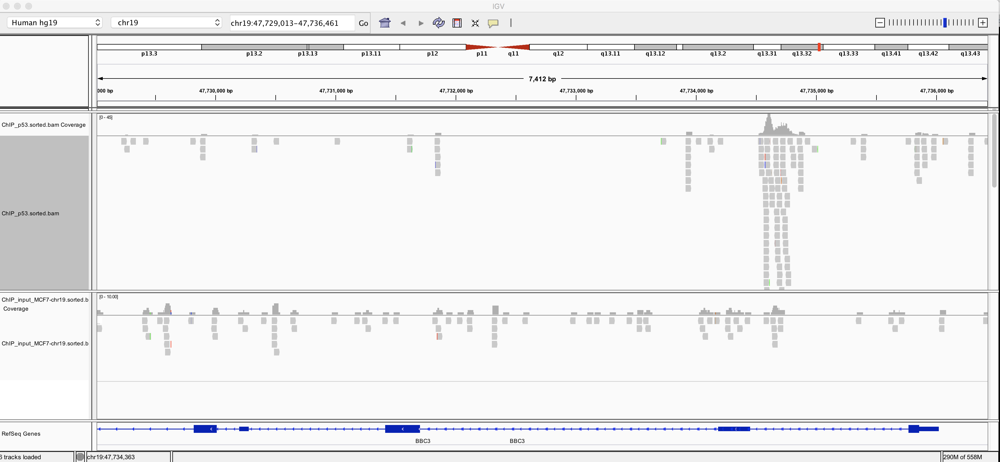

## Genome-wide coverage plots

We will generate a bigwig file that contains only the coverage of the reads, so not the individual reads. This bigWig file is a binary file format (simlar to BAM), and it can be accessed over the internet. This means that you can use the bigWig file locallly in IGV, but also as custom track in UCSC (provided that the bigWig is available from a web/ftp server, so you can specific the custom track by entering the URL).

We're using the command bamCoverage from the package deeptools to create a bigwig file that can be used for visualization in IGV or UCSC Genome Browser

The size of chr19 is 59,128,983 bp (you can find that on the UCSC Genome Browser).

In [23]:
bamCoverage -b ChIP_p53.sorted.bam --normalizeUsing RPGC --effectiveGenomeSize 59128983 -o p53-chr19.bw

normalization: 1x (effective genome size 59128983)
bamFilesList: ['ChIP_p53.sorted.bam']
binLength: 50
numberOfSamples: None
blackListFileName: None
skipZeroOverZero: False
bed_and_bin: False
defaultFragmentLength: read length
numberOfProcessors: 1
verbose: False
region: None
bedFile: None
minMappingQuality: None
ignoreDuplicates: False
chrsToSkip: []
stepSize: 50
center_read: False
samFlag_include: None
samFlag_exclude: None
minFragmentLength: 0
maxFragmentLength: 0
zerosToNans: False
smoothLength: None
save_data: False
out_file_for_raw_data: None
maxPairedFragmentLength: 1000


Open that .bw file in IGV (=> green track)

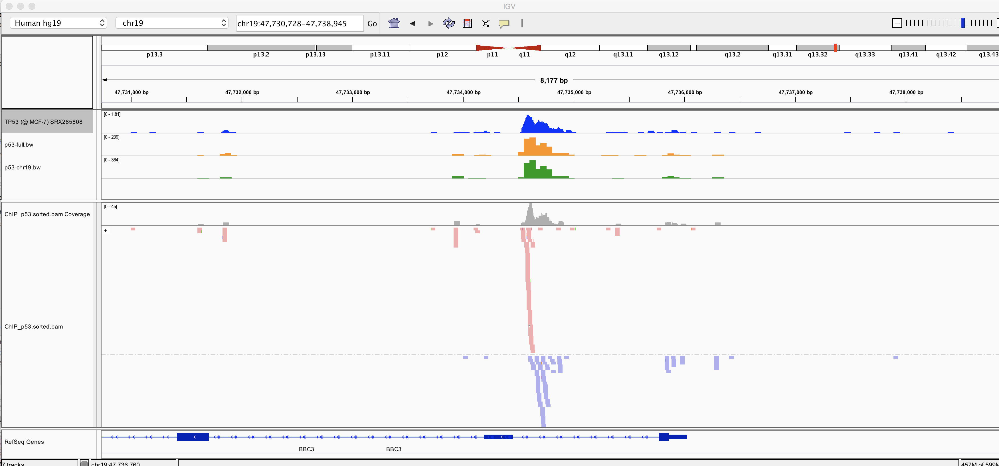

I've also opened the full-genome bigWig file in IGV (orange track), using the File-Load from URL (http://students.aertslab.org/p53-full.bw)

Finally, from the ChIP-atlas page of this data set http://chip-atlas.org/view?id=SRX285808, I have chosen "View on IGV - bigWig", which automatically opens the bigWig file in my local IGV (blue track)


## Peak calling 

Next, we will determine genomic regions with an enrichment of reads, in the form of a "peak". 


* Figure from this article: http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0011471

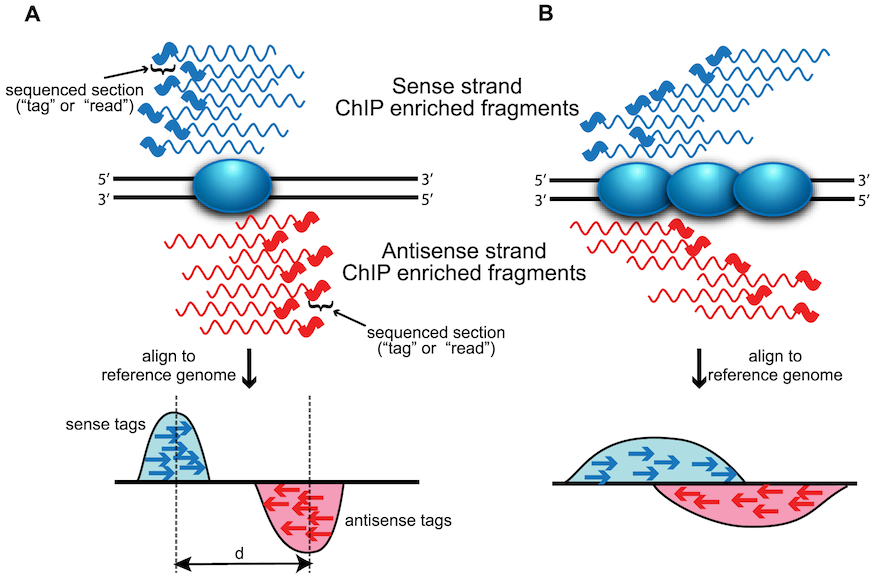

<i>Figure caption from the paper:
Strand-dependent bimodality in tag density.
The 5′ to 3′ sequencing requirement and short read length produce stranded bias in tag distribution. The shaded blue oval represents the protein of interest bound to DNA (solid black lines). Wavy lines represent either sense (blue) or antisense (red) DNA fragments from ChIP enrichment. The thicker portion of the line indicates regions sequenced by short read sequencing technologies. Sequenced tags are aligned to a reference genome and projected onto a chromosomal coordinate (red and blue arrows). (A) Sequence-specific binding events (e.g. transcription factors) are characterized by “punctuate enrichment” and defined strand-dependent bimodality, where the separation between peaks (d) corresponds to the average sequenced fragment length. Panel A was inspired by Jothi et al. (B) Distributed binding events (e.g. histones or RNA polymerase) produce a broader pattern of tag enrichment that results in a less defined bimodal pattern.</i>

If you color the reads by strand (right click in IGV, color alignments by read strand), you will notice the shift between forward and reverse reads.

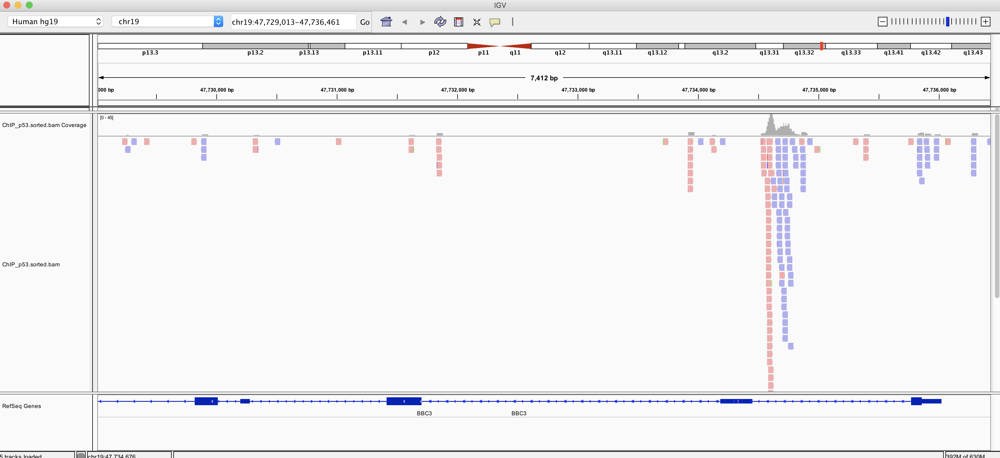

You can also group reads by read strand - here is another example of a target gene, CDKN1A, located on another chromosome, so I'm using the p53-full.bam file. Again we observe the shift in reads between positive and negative strand.

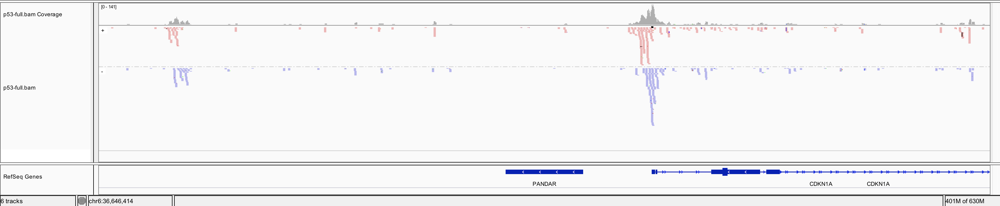

## Peak calling with MACS2

MACS implements a model to take advantage of the strand shift, to distinguish true, bona fide peaks, from artifacts.

In [24]:
macs2 

usage: macs2 [-h] [--version]
             {callpeak,bdgpeakcall,bdgbroadcall,bdgcmp,bdgopt,cmbreps,bdgdiff,filterdup,predictd,pileup,randsample,refinepeak}
             ...
macs2: error: too few arguments


: 2

The size of chr19 is 59,128,983 bp (you can find that on the UCSC Genome Browser).

In [25]:
macs2 callpeak -t ChIP_p53.sorted.bam -c ChIP_input_MCF7-chr19.sorted.bam -n p53 -g 59128983 -q 0.5

INFO  @ Wed, 25 Sep 2019 15:53:15: 
# Command line: callpeak -t ChIP_p53.sorted.bam -c ChIP_input_MCF7-chr19.sorted.bam -n p53 -g 59128983 -q 0.5
# ARGUMENTS LIST:
# name = p53
# format = AUTO
# ChIP-seq file = ['ChIP_p53.sorted.bam']
# control file = ['ChIP_input_MCF7-chr19.sorted.bam']
# effective genome size = 5.91e+07
# band width = 300
# model fold = [5, 50]
# qvalue cutoff = 5.00e-01
# Larger dataset will be scaled towards smaller dataset.
# Range for calculating regional lambda is: 1000 bps and 10000 bps
# Broad region calling is off
# Paired-End mode is off
 
INFO  @ Wed, 25 Sep 2019 15:53:15: #1 read tag files... 
INFO  @ Wed, 25 Sep 2019 15:53:15: #1 read treatment tags... 
INFO  @ Wed, 25 Sep 2019 15:53:15: Detected format is: BAM 
INFO  @ Wed, 25 Sep 2019 15:53:15: * Input file is gzipped. 
INFO  @ Wed, 25 Sep 2019 15:53:15: #1.2 read input tags... 
INFO  @ Wed, 25 Sep 2019 15:53:15: Detected format is: BAM 
INFO  @ Wed, 25 Sep 2019 15:53:15: * Input file is gzipped. 
INFO 

In [26]:
ls -lt | head -5

total 179400
-rw-r--r-- 1 u0038182 domain users     1299 Sep 25 15:53 p53_summits.bed
-rw-r--r-- 1 u0038182 domain users     2087 Sep 25 15:53 p53_peaks.narrowPeak
-rw-r--r-- 1 u0038182 domain users     3490 Sep 25 15:53 p53_peaks.xls
-rw-r--r-- 1 u0038182 domain users    77884 Sep 25 15:53 p53_model.r


macs2 produces the following 4 files:

* `p53_peaks.xls`: is a tabular file which contains information about called peaks. You can open it in excel and sort/filter using excel functions. Information include position, length and height of detected peak etc.
* `p53_peaks.narrowPeak`: is BED6+4 format file which contains the peak locations together with peak summit, p-value and q-value. You can load it directly to IGV or UCSC genome browser.
* `p53_summits.bed`: is in BED format, which contains the peak summits locations for every peaks. The 5th column in this file is -log10p-value the same as NAME_peaks.bed. If you want to find the motifs at the binding sites, this file is recommended. The file can be loaded directly to UCSC genome browser. But remember to remove the beginning track line if you want to analyze it by other tools.
* `p53_model.r`: is an R script which you can use to produce a PDF image about the model based on your data. Load it to R by: `$ Rscript NAME_model.r` Then a pdf file NAME_model.pdf will be generated in your current directory. Note, R is required to draw this figure.

In [27]:
cat p53_peaks.narrowPeak | wc -l

30


Copy the `p53_peaks.narrowPeak` file to your computer, and open it in IGV. Now you can see the called peak in the BBC3 intron.

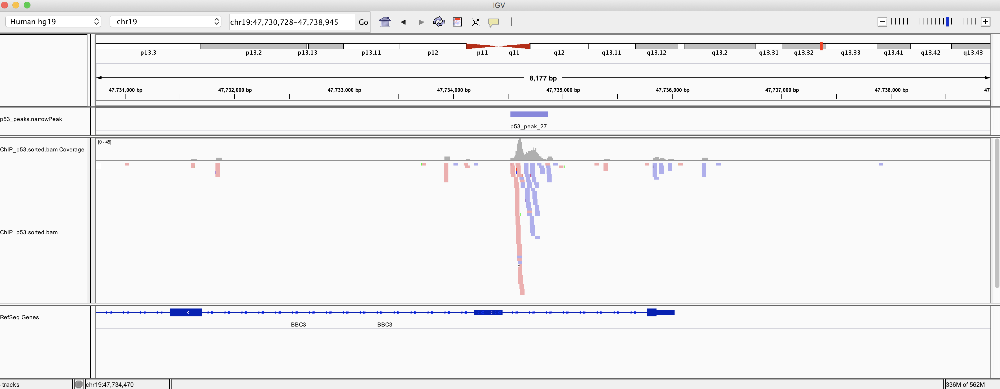

## Genome-wide ChIP-seq peaks

For the genome-wide analysis, you can run macs2 callpeak on the full BAM file (`p53-nutlin.bam`) with the full genome input file (`input.bam`).

We have already done this. The resulting .narrowPeak file is here: ...

In [32]:
#cd /mnt/storage/data/chipseq/p53

In [33]:
#macs2 callpeak -t p53-nutlin.bam -c input.bam -n p53-full -g hs -q 0.05

INFO  @ Wed, 25 Sep 2019 16:06:54: 
# Command line: callpeak -t p53-nutlin.bam -c input.bam -n p53-full -g hs -q 0.05
# ARGUMENTS LIST:
# name = p53-full
# format = AUTO
# ChIP-seq file = ['p53-nutlin.bam']
# control file = ['input.bam']
# effective genome size = 2.70e+09
# band width = 300
# model fold = [5, 50]
# qvalue cutoff = 5.00e-02
# Larger dataset will be scaled towards smaller dataset.
# Range for calculating regional lambda is: 1000 bps and 10000 bps
# Broad region calling is off
# Paired-End mode is off
 
INFO  @ Wed, 25 Sep 2019 16:06:54: #1 read tag files... 
INFO  @ Wed, 25 Sep 2019 16:06:54: #1 read treatment tags... 
INFO  @ Wed, 25 Sep 2019 16:06:54: Detected format is: BAM 
INFO  @ Wed, 25 Sep 2019 16:06:54: * Input file is gzipped. 
INFO  @ Wed, 25 Sep 2019 16:06:57:  1000000 
INFO  @ Wed, 25 Sep 2019 16:06:59:  2000000 
INFO  @ Wed, 25 Sep 2019 16:07:01:  3000000 
INFO  @ Wed, 25 Sep 2019 16:07:03:  4000000 
INFO  @ Wed, 25 Sep 2019 16:07:05:  5000000 
INFO  @ Wed,

In [35]:
#cd ~/data/jupyternotebooks/chipseq
ln -sf /mnt/storage/data/chipseq/p53/p53-full.bw .
ln -sf /mnt/storage/data/chipseq/p53/p53-full_peaks.narrowPeak .

deeptools has a couple of commands to visualize the ChIP-seq data, see here for some examples: http://deeptools.readthedocs.io/en/latest/content/example_gallery.html

below we are going to plot a heatmap of all TSS in the human genome, showing the coverage of the p53 ChIP-seq data, to see whether there is an enrichment in 2kb around the TSS

In [37]:
cat p53-full_peaks.narrowPeak | wc -l

657


In [39]:
cat p53-full_peaks.narrowPeak | cut -f 1-3 > p53-full_peaks.bed

In [40]:
computeMatrix reference-point \
    -S p53-full.bw \
    -R p53-full_peaks.bed \
    --referencePoint center \
    -a 2000 \
    -b 2000 \
    --binSize 5 \
    -out p53-full.tab.gz

In [46]:
plotHeatmap \
    -m p53-full.tab.gz \
    -out p53-peaks5.png \
    --heatmapHeight 15  \
    --refPointLabel peak.center \
    --regionsLabel peaks \
    --plotTitle 'ChIP-seq signal'

![](chipseq/p53-peaks5.png)

There is a big difference in the peak height among the all peaks !

## Motif Analysis

### 1. De novo motif discovery

Run RSAT peak-motifs at the RSAT website http://rsat.sb-roscoff.fr

Here is a tutorial for RSAT peak-motifs: http://embnet.ccg.unam.mx/rsat//htmllink.cgi?title=RSAT-tutorials&file=tutorials/tut_peak-motifs.html

Background information about position-specific scoring matrices (PSSM) is here: http://embnet.ccg.unam.mx/rsat//htmllink.cgi?title=RSAT-tutorials&file=tutorials/tut_peak-motifs.html

Before running peak-motifs, you need as input the <b>FASTA sequences of the peaks</b>. How to get these?
One option: use fetch-sequences from UCSC in RSAT first. http://rsat.sb-roscoff.fr/fetch-sequences_form.php.
Other options include UCSC Table Browser (first make a custom track of your peak BED file) or command-line (e.g., using BEDTools).



Here is the first part of the RSAT peak-motifs output: the sequence composition

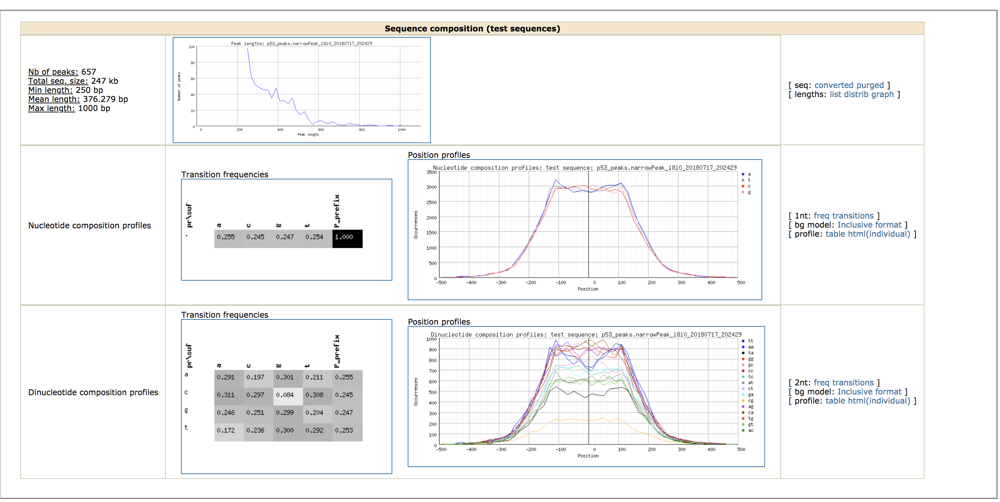

Next is the first motif, it is the TP53 motif !
The significance is very high, nice. And 72% of the input peaks contain at least one instance of this motif.

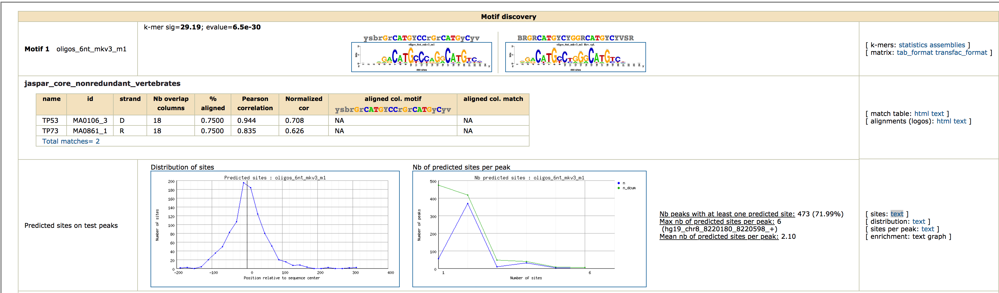

Most of the matches occur in the center of the peak (good !), and most peaks have just a single motif instance.

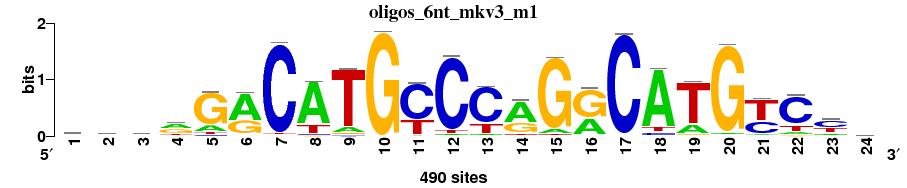

## Create a BED file with only the DIRECT peaks = peaks with the TP53 motif

473 peaks have a predicted site, you can download these by clicking on the "sites" link on the RSAT results page.

In [47]:
cat peak-motifs_oligos_6nt_mkv3_m1_sites.tab | grep -v ";" | grep -v '#' | head

hg19_chr1_9241976_9242475_+	site	oligos_6nt_mkv3_m1	D	-26	-3	TCGGAACAAGCCCAGGCAAGCCCA	14.6
hg19_chr1_9241976_9242475_+	site	oligos_6nt_mkv3_m1	R	-24	-1	CCTGGGCTTGCCTGGGCTTGTTCC	10.8
hg19_chr1_12267183_12267459_+	site	oligos_6nt_mkv3_m1	D	7	30	TCGGGGCATGCTGGGGCAAGTCCC	11.4
hg19_chr1_12267183_12267459_+	site	oligos_6nt_mkv3_m1	R	9	32	CAGGGACTTGCCCCAGCATGCCCC	10.4
hg19_chr1_29565828_29566077_+	site	oligos_6nt_mkv3_m1	D	-25	-2	TAAAGGCTTGTCTGGGCATCCCTC	9.0
hg19_chr1_29565828_29566077_+	site	oligos_6nt_mkv3_m1	R	-23	0	GGGAGGGATGCCCAGACAAGCCTT	10.9
hg19_chr1_41947947_41948333_+	site	oligos_6nt_mkv3_m1	D	-62	-39	CCAGGGCATGCCCGGGCTTGCAGC	11.3
hg19_chr1_41947947_41948333_+	site	oligos_6nt_mkv3_m1	R	-60	-37	TAGCTGCAAGCCCGGGCATGCCCT	11.8
hg19_chr1_42998892_42999259_+	site	oligos_6nt_mkv3_m1	D	-110	-87	TTGTGGCATGCCTGGGCATGTAGT	12.7
hg19_chr1_42998892_42999259_+	site	oligos_6nt_mkv3_m1	R	-108	-85	TTACTACATGCCCAGGCATGCCAC	14.7
grep: write error


In [121]:
cat peak-motifs_oligos_6nt_mkv3_m1_sites.tab | grep -v ";" | grep -v '#' | cut -f 1 | tr "_" "\t" | cut -f 2-4 | head

chr1	9241976	9242475
chr1	9241976	9242475
chr1	12267183	12267459
chr1	12267183	12267459
chr1	29565828	29566077
chr1	29565828	29566077
chr1	41947947	41948333
chr1	41947947	41948333
chr1	42998892	42999259
chr1	42998892	42999259
cut: write error: Broken pipe


In [122]:
cat peak-motifs_oligos_6nt_mkv3_m1_sites.tab | grep -v ";" | grep -v '#' | cut -f 1 | tr "_" "\t" | cut -f 2-4 > p53-allpeaks-with-motif-RSAT.bed

## PWM and track enrichment
Next to de novo motif enrichment, which we did above with RSAT, we can also ask whether the TP53 ChIP-seq peaks we found are enriched for matches to known PSSMs (PWMs) from PSSM databases like JASPAR, TRANFAC, cis-bp, HOCOMOCO, etc.

In addition, we can ask whether our peaks overlap significantly (or "correlate") with other epigenomic data sets, called "tracks". For example, histone modification ChIP-seq tracks, or chromatin accessibility tracks. Some web-based tools that do this include i-cisTarget, Enrichr, and LOLA.

i-cisTarget will test for enrichment of motifs, using a collection of databases of PSSMs, as well as tracks.

Below, we have uploaded our ChIP-seq peak file to i-cisTarget https://gbiomed.kuleuven.be/apps/lcb/i-cisTarget/. This will place your job in a queue, which can take a while (~15 min or so) to complete.

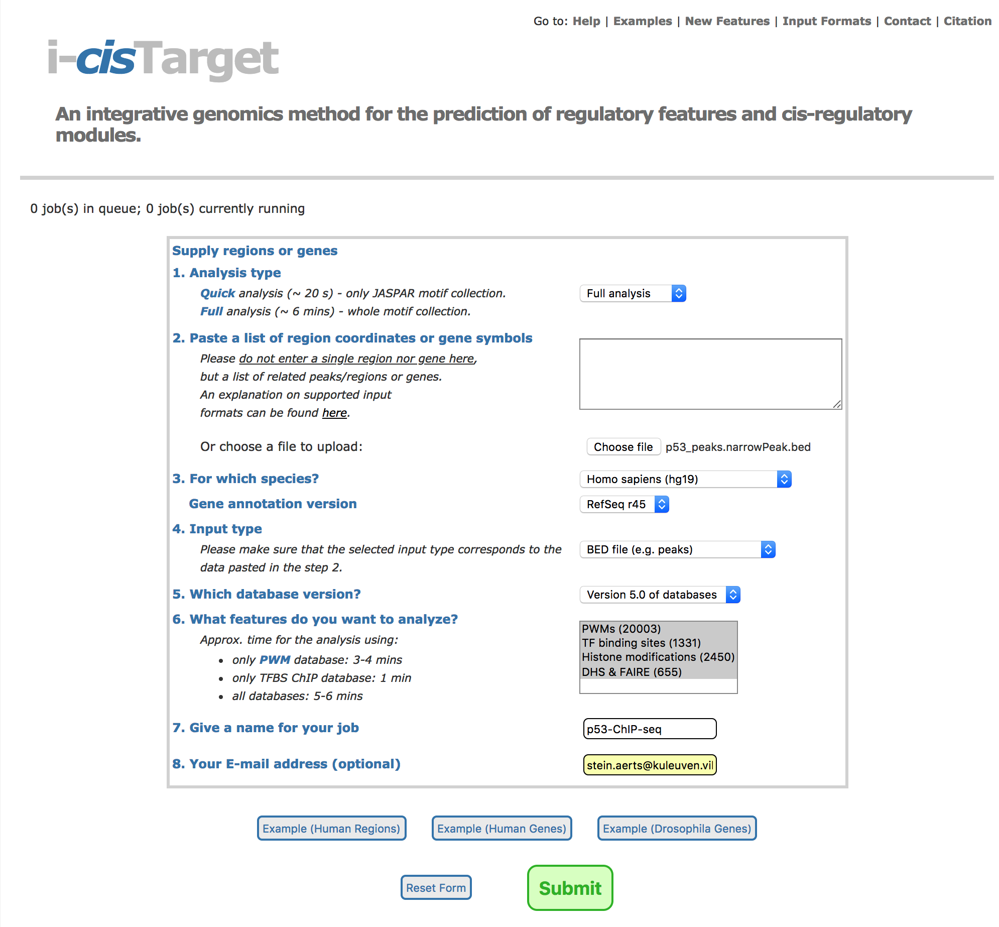

This is the link to the results:
https://gbiomed.kuleuven.be/apps/lcb/i-cisTarget-mcv8/reports/c2aa468e31e6288a9e3cfa6b4efd1b28f74fc1a0/report.html

We find (many variations of) the TP53 motif as the first motif, good !

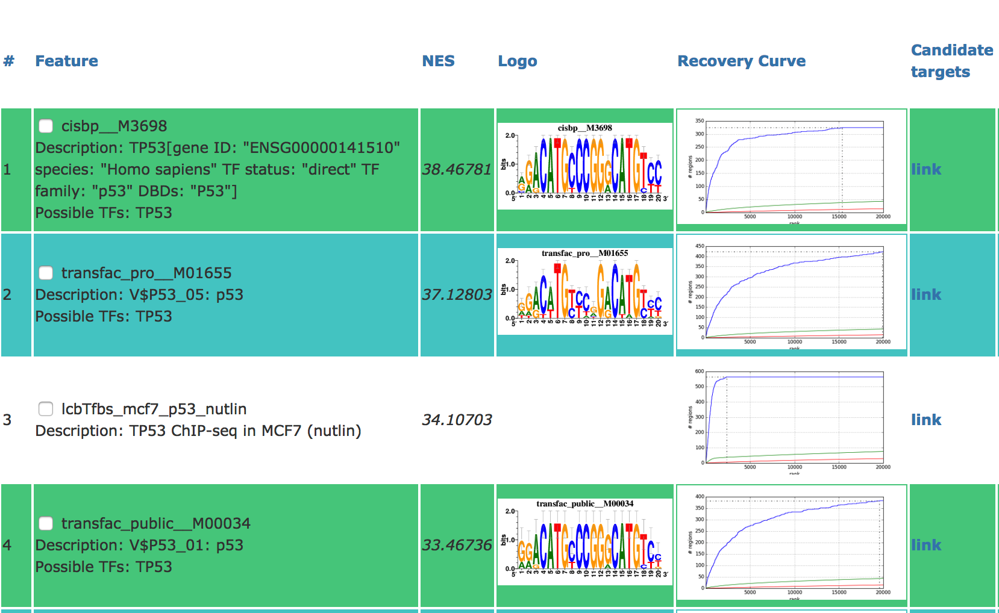

This tool also provides a "recovery plot" of your input ChIP-seq peaks, ranked by this motif across the genome. This leads to a "leading edge", similar to GSEA analysis. We see that around 320 peaks are in the leading edge, so about half of the input peaks contain a good match of the TP53 motif. 

The other peaks either have a weak TP53 motif (hard to distinguish from background), or they are indirectly bound by TP53, or they are cross-linking artifacts (i.e. phantom peaks).

The enriched tracks (white boxes without motifs) show that the TP53 ChIP-seq data is enriched, as expected (it's a positive control). Further below, among the other enriched tracks we do not find any obvious/interesting tracks.

### Leading edge in i-cisTarget for the TP53 motif = directly bound regions

Click on the link under "Candidate targets". On the page with the targets, scroll down, you will find a BED file with the regions in the leading edge, having a strong motif match.

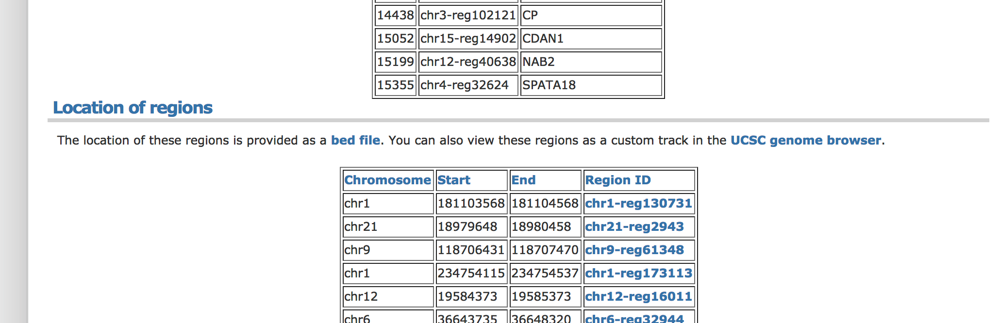

In [123]:
cat cisbp__M3698.targets.bed | head

track name=cisbp__M3698_candidate_targets description="" useScore=1
chr15	80777388	80778388	chr15-reg47552
chr12	127380335	127381115	chr12-reg91539
chr7	117270255	117271255	chr7-reg78915
chr15	73457775	73458775	chr15-reg40272
chr2	102320475	102321110	chr2-reg72291
chr8	133037195	133038195	chr8-reg85631
chr21	47052765	47054404	chr21-reg23766
chr2	137133088	137133458	chr2-reg95102
chr2	88837720	88838508	chr2-reg65381


In [124]:
cat cisbp__M3698.targets.bed | wc -l

325


## Link Peaks to Genes

We're going to use GREAT to link peaks to genes. GREAT also determines Gene Ontology enrichment of the linked (target) genes. 

Careful, in the advanced settings, you will see that by default, a distance of 1000kb is allowed between peak and gene. This is very far. <b>Let's try 50kb there</b>.

We start with all p53 peaks (direct and indirect). This is more general, and can also be used if there is no motif enriched (however, usually we expect the motif enriched, it's a kind of quality control). Below we will also test the direct peaks only.


Known p53 target genes are enriched in this list, it worked !

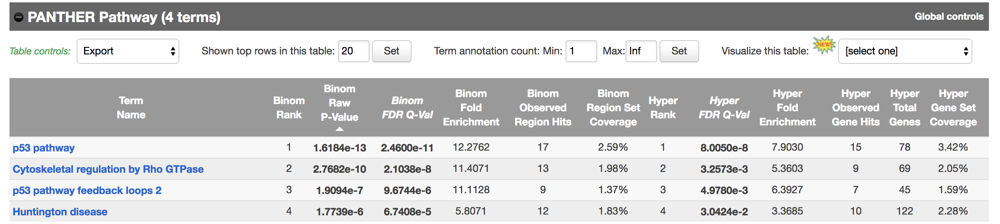

Clicking on p53 pathway, we can retrieve the peaks and the genes:

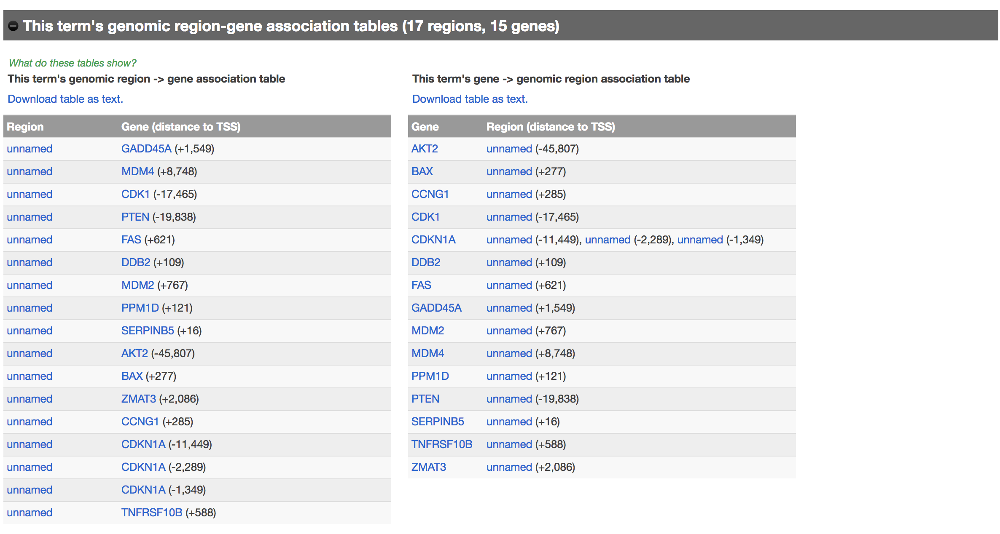

In GREAT output, in the "Job Description", we can download a table with all genes linked to all the peaks:
Copy that file to the server (to this working directory). Now we have a list of putative target genes.

In [40]:
head 20180717-public-3.0.0-hxn0ec-hg19-all-gene.txt

# GREAT version 3.0.0	Species assembly: hg19	Association rule: Basal+extension: 5000 bp upstream, 1000 bp downstream, 50000 bp max extension, curated regulatory domains included
ABCA12	unnamed (+450)
ABCF3	unnamed (-4967)
ACBD6	unnamed (-13266)
ACKR2	unnamed (+14119)
ACTA2	unnamed (+112)
ACTB	unnamed (+1491), unnamed (+2348), unnamed (+3228)
ACTG1	unnamed (+2250)
ACTN1	unnamed (-9209)
ADCY9	unnamed (-24679)


In [42]:
cat 20180717-public-3.0.0-hxn0ec-hg19-all-gene.txt | cut -f 1 | grep -v '#' | wc -l

440


In [43]:
cat 20180717-public-3.0.0-hxn0ec-hg19-all-gene.txt | cut -f 1 | grep -v '#' | grep BBC3

BBC3


In [44]:
cat 20180717-public-3.0.0-hxn0ec-hg19-all-gene.txt | cut -f 1 | grep -v '#' > TP53-targets-GREAT.txt

## Comparison of predicted targets with functional associations to TP53

Let's see if some more of these genes are "related" to TP53. Using https://string-db.org/ we can obtain a network of associated genes with TP53, based on genetic interactions, physical interactions, co-expression, and literature co-mentioning (in abstracts).

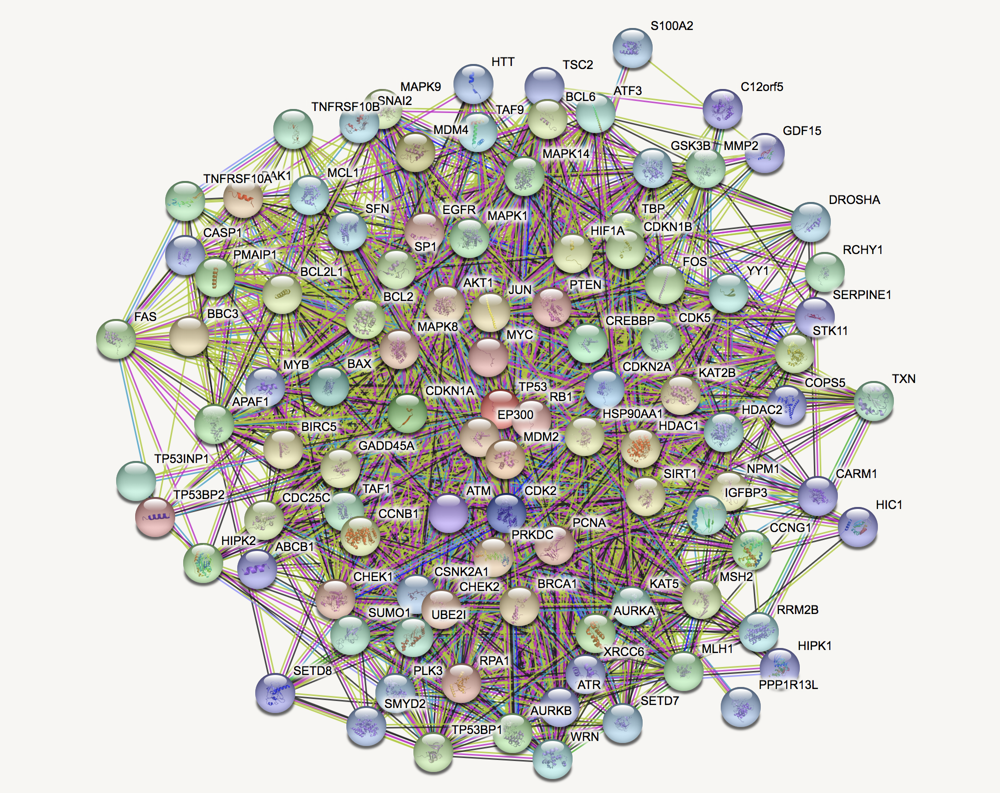

In [58]:
cat string_protein_annotations.tsv | cut -f1 | head

#node
SNAI2
C12orf5
SIRT1
MAPK1
AURKA
CSNK2A1
TAF9
MMP2
TSC2


In [54]:
cat string_protein_annotations.tsv | cut -f 1 | grep -v '#' > p53-string-top100.txt

In [55]:
list=`cat p53-string-top100.txt`

In [69]:
for i in $list; do grep -w $i TP53-targets-GREAT.txt; done

C12orf5
CDKN1A
RRM2B
GDF15
TNFRSF10B
BAX
BCL2L1
PMAIP1
TP53INP1
ATF3
CCNG1
FAS
MDM4
S100A2
GADD45A
PTEN
PLK3
PCNA
BBC3
MDM2


: 1

In [70]:
for i in $list; do grep -w $i TP53-targets-GREAT.txt; done > targets.txt

: 1

This short list of genes has:
* a ChIP-seq peak nearby (<50kb)
* is somehow associated with TP53
These are very good candidates to be TP53 direct targets !! (most of them are known as direct targets in fact).

We can make this more lenient (find more candidates) by 
* allowing more distance between the peak and the target genes
* allowing smaller peaks by setting the MACS2 q-value less stringent (not recommended)
* fetching more associations to TP53 in STRING

## Comparison with (sc)RNA-seq data

Possibly, we could test these genes in the RNA-seq data, for example by plotting a heatmap of the expresssion data for all the predicted targets. 
Or, we simply overlap these genes with the gene signature of up-regulated genes.
Or, we test this set with GSEA against the ranking of up-vs-down regulated genes.

We can check some of these genes in the scRNA-seq (drop-seq) data of nutlin-3a versus control cells. We use the asap.epfl.ch webtool to visualize the drop-seq data.

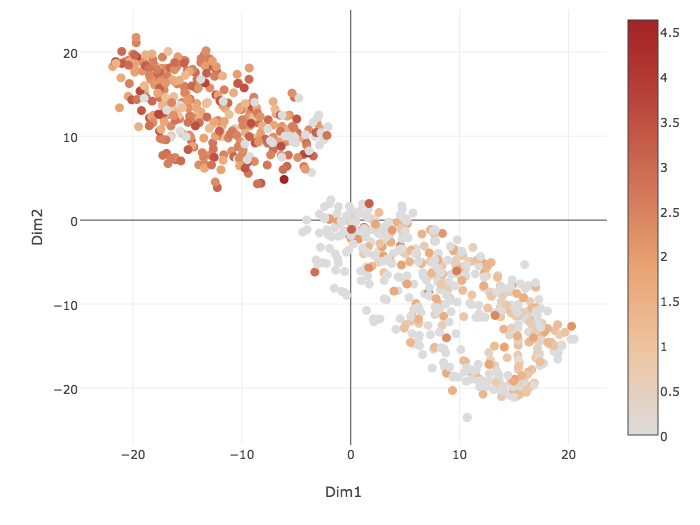
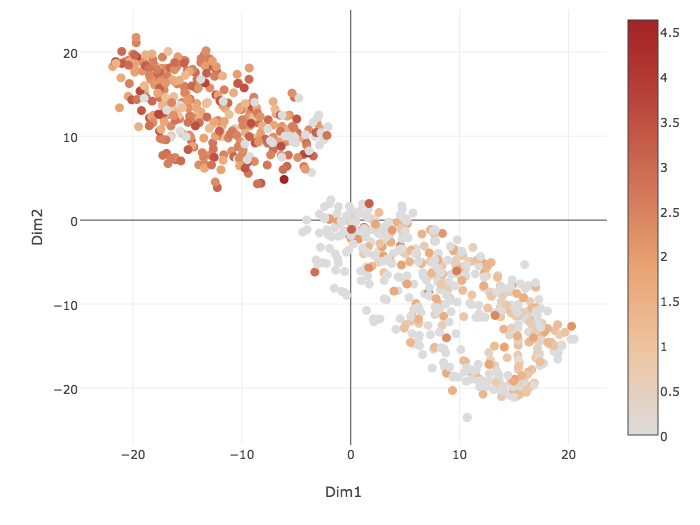

#### Using GSEA

We can use the bulk RNA-seq DESeq.tsv results. This file contain all the measured genes with their log fold change (logFC) of nutlin-3a versus control. We will sort this file by logFC, then select gene name and logFC value to generate a two-column tab-separted file, with .rnk extenstion. This is important to load the file into the GSEA tool.

In [49]:
cat /mnt/storage/data/RNA-seq/GSE47042/deseq.results.tsv | head

Gene	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
PLK1	2169.89887036599	-4.66219867916598	0.133635353659893	-34.8874646677065	1.15177059571362e-266	1.68388861093331e-262
CDKN1A	25241.2080295721	4.42457936561409	0.129633158756298	34.1315401712306	2.5125839341367e-255	1.83669885585392e-251
CDC20	2087.37990872435	-4.40177745450003	0.130177472157127	-33.8136651569558	1.24205653171511e-250	6.05295549789164e-247
TP53INP1	3332.81998084826	4.14308467439012	0.12651543848487	32.7476608705394	3.27820954642684e-235	1.19818558921901e-231
CCNA2	1833.68494342593	-4.58742887189172	0.141728770920042	-32.3676614290247	7.82962634244032e-230	2.28938274252955e-226
KIF20A	2304.20076082827	-4.59980047267874	0.142632224344441	-32.2493776831997	3.58935101133231e-228	8.74605196427972e-225
HMGB2	2441.5235956432	-3.64481763157341	0.121698431532697	-29.9495859204572	4.4548629638111e-197	9.3042995044169e-194
PRC1	3467.82739378419	-3.21578273306019	0.107728899485699	-29.8506969662961	8.59778727441137e-196	1.571245

In [54]:
cat /mnt/storage/data/RNA-seq/deseq.results.tsv | grep -w -v NA | sort -k 3,3gr | grep -n BBC3

92:BBC3	562.315816976695	2.59896850867815	0.203037787797711	12.8004177787217	1.63071560344179e-37	7.52083978622048e-36


In [55]:
cat /mnt/storage/data/RNA-seq/deseq.results.tsv | grep -w -v NA | sort -k 3,3gr | grep -n CDKN1A

7:CDKN1A	25241.2080295721	4.4245793648994	0.129633159488639	34.131539972897	2.51260095753458e-255	1.83671129995778e-251


In [56]:
cat /mnt/storage/data/RNA-seq/deseq.results.tsv | grep -w -v NA | sort -k 3,3gr | cut -f 1,3 > RNA-seq.rnk

Next, we will create a .gmt file that contains one or more gene sets. In this case one gene set, namely the set of predicted target genes based on ChIP-seq + STRING. You can also create this tab-separated file in Excel. Importantly, the first column contains the name of the set, the second column a description (we just write desc), and then all the gene names in the next columns. This .gmt file can also contain multiple gene sets, in which case they occupy different rows.

In [76]:
echo -n "targets","desc",`cat targets.txt | tr '\n' ',' ` | tr ',' '\t'

targets	desc	C12orf5	CDKN1A	RRM2B	GDF15	TNFRSF10B	BAX	BCL2L1	PMAIP1	TP53INP1	ATF3	CCNG1	FAS	MDM4	S100A2	GADD45A	PTEN	PLK3	PCNA	BBC3	MDM2	

In [77]:
echo -n "targets","desc",`cat targets.txt | tr '\n' ',' ` | tr ',' '\t' > targets.gmt

Now we open our local GSEA tool. We use the "Load data" button and choose both the .rnk and .gmt files to be loaded.
Next, we run GSEAPreranked, choosing the .gmt file as "Gene sets database" and the .rnk file as "ranked list". Then press "run" and when it is finished, click on the "Success". This opens a HTML file with the results. The set is significantly enriched among the top up-regulated genes ! Succes !

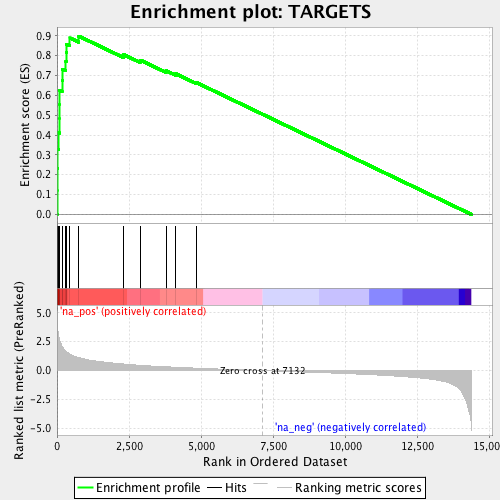

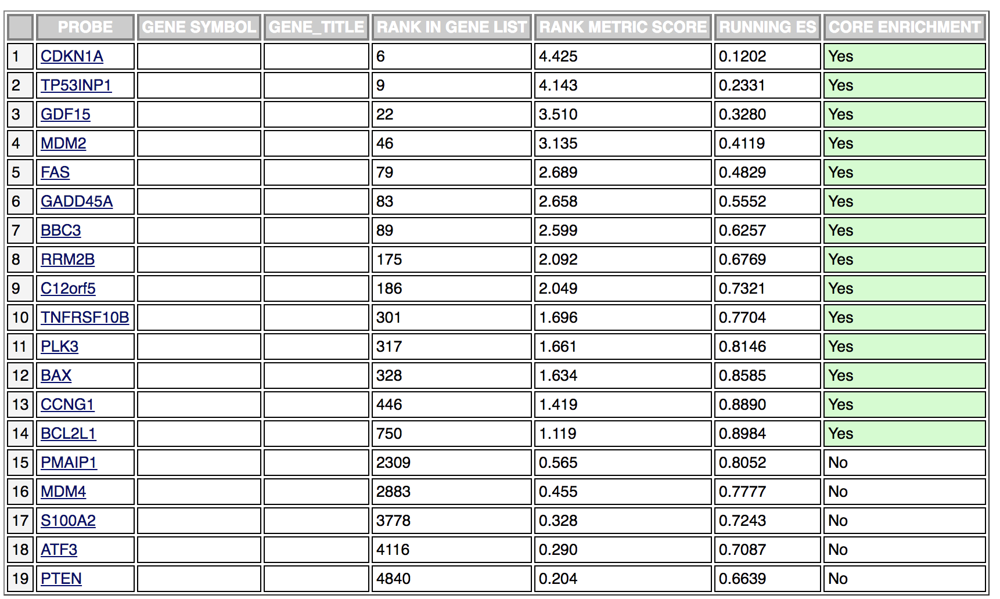

the genes in the leading edge are high-confidence targets!

* Interestingly, this also gives a good cutoff for the RNA-seq ranked gene list: the leading edge is at 750 - agrees quite well with our arbitrary cutoff of logFC>1 and padj<0.05 (around 800 genes)

copy-paste the list of genes in the leading edge:

CDKN1A
TP53INP1
GDF15
MDM2
FAS
GADD45A
BBC3
RRM2B
C12orf5
TNFRSF10B
PLK3
BAX
CCNG1
BCL2L1



In [49]:
list='CDKN1A TP53INP1 GDF15 MDM2 FAS GADD45A BBC3 RRM2B C12orf5 TNFRSF10B PLK3 BAX CCNG1 BCL2L1'
for i in $list; do echo "TP53,$i"; done | tr ',' '\t'

TP53	CDKN1A
TP53	TP53INP1
TP53	GDF15
TP53	MDM2
TP53	FAS
TP53	GADD45A
TP53	BBC3
TP53	RRM2B
TP53	C12orf5
TP53	TNFRSF10B
TP53	PLK3
TP53	BAX
TP53	CCNG1
TP53	BCL2L1


In [50]:
for i in $list; do echo "TP53,$i"; done | tr ',' '\t' > TP53-targets.txt

Optional. 
You can load this .txt file into Cytoscape, using File->Import->Network->File. 
Then, select the first column as source node, and the second as target node. In Advanced Options, turn of the option "use first line as column names".

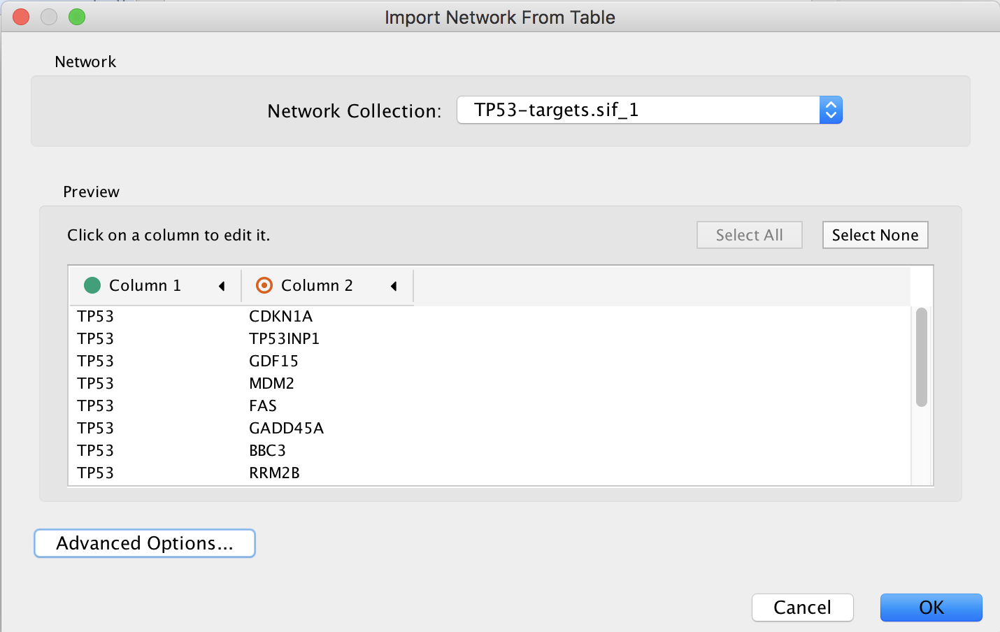

Here's our small network of high-confidence TP53 targets:

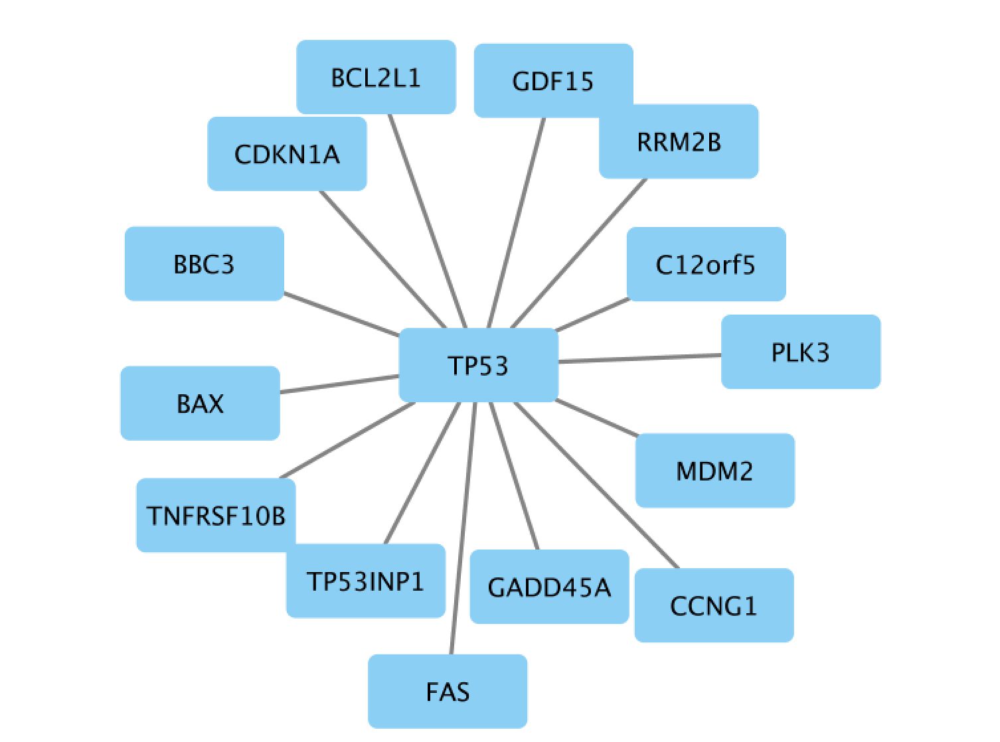

Using the Cytoscape tutorial, you can load the RNA-seq data and color the nodes by their logFC.

#### GeneMania
We can repeat this process using GeneMania instead of STRING. In https://genemania.org/, enter TP53, go to "Customize advanced options" and set "maximum resultant genes" to 100. Then save the list of TP53-associated genes.

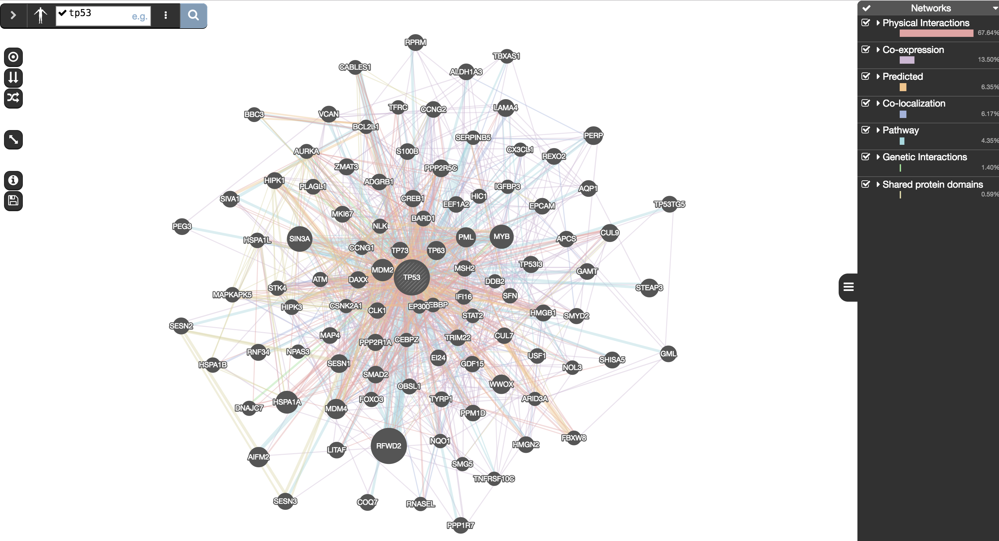

In [88]:
cat genemania-genes-TP53.txt | cut -f 1 | head 

Symbol
TP53
RFWD2
SIN3A
MYB
HSPA1A
MDM2
AIFM2
MDM4
PML


In [89]:
cat genemania-genes-TP53.txt | cut -f 1 | grep -v Symbol > top100-genemania.txt

In [91]:
list=`cat top100-genemania.txt`

In [92]:
for i in $list; do grep -w $i TP53-targets-GREAT.txt; done

MDM2
MDM4
STEAP3
ZMAT3
ALDH1A3
GML
PPM1D
GDF15
BBC3
SERPINB5
NQO1
BCL2L1
CCNG1
TNFRSF10C
DDB2


: 1

A couple of different genes are now added !

In [93]:
for i in $list; do grep -w $i TP53-targets-GREAT.txt; done > p53-targets-ChIP-genemania.txt


: 1

In [109]:
echo -n "targets-genemania","desc",`cat p53-targets-ChIP-genemania.txt | tr '\n' ',' ` | tr ',' '\t'

targets-genemania	desc	MDM2	MDM4	STEAP3	ZMAT3	ALDH1A3	GML	PPM1D	GDF15	BBC3	SERPINB5	NQO1	BCL2L1	CCNG1	TNFRSF10C	DDB2	

In [110]:
ls -lt *.gmt

-rw-r--r-- 1 u0038182 domain users  94 jul 18 00:27 p53-targets-ChIP-genemania.gmt
-rw-r--r-- 1 u0038182 domain users 137 jul 17 23:57 targets.gmt


In [113]:
echo "" >> targets.gmt
echo -n "targets-genemania","desc",`cat p53-targets-ChIP-genemania.txt | tr '\n' ',' ` | tr ',' '\t' >> targets.gmt

In [115]:
cat targets.gmt

targets	desc	C12orf5	CDKN1A	RRM2B	GDF15	TNFRSF10B	BAX	BCL2L1	PMAIP1	TP53INP1	ATF3	CCNG1	FAS	MDM4	S100A2	GADD45A	PTEN	PLK3	PCNA	BBC3	MDM2
targets-genemania	desc	MDM2	MDM4	STEAP3	ZMAT3	ALDH1A3	GML	PPM1D	GDF15	BBC3	SERPINB5	NQO1	BCL2L1	CCNG1	TNFRSF10C	DDB2


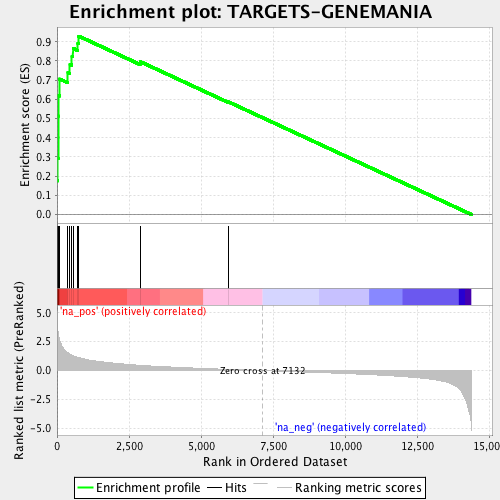

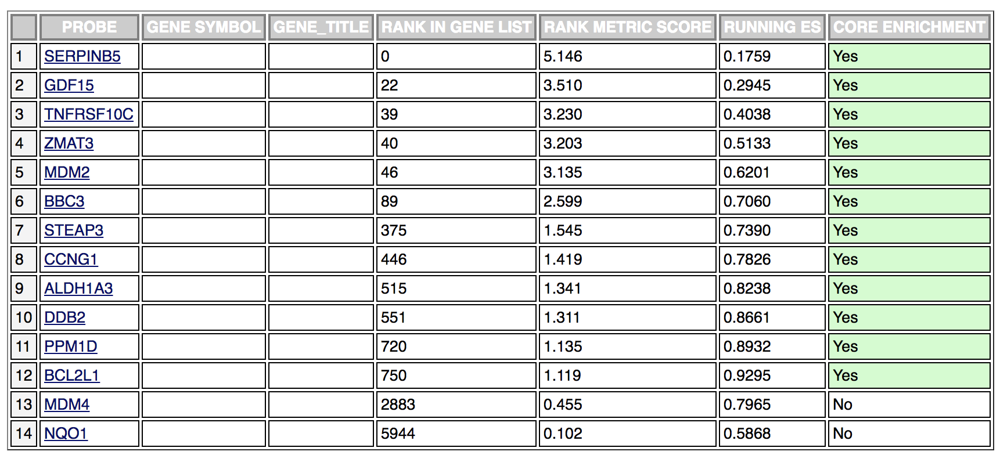

We can also do this without STRING or GeneMania "filtering", just with the entire list of ChIP-seq targets from GREAT. 


In [116]:
echo "" >> targets.gmt
echo -n "all-targets","desc",`cat TP53-targets-GREAT.txt | tr '\n' ',' ` | tr ',' '\t' >> targets.gmt

In [117]:
cat targets.gmt

targets	desc	C12orf5	CDKN1A	RRM2B	GDF15	TNFRSF10B	BAX	BCL2L1	PMAIP1	TP53INP1	ATF3	CCNG1	FAS	MDM4	S100A2	GADD45A	PTEN	PLK3	PCNA	BBC3	MDM2
targets-genemania	desc	MDM2	MDM4	STEAP3	ZMAT3	ALDH1A3	GML	PPM1D	GDF15	BBC3	SERPINB5	NQO1	BCL2L1	CCNG1	TNFRSF10C	DDB2

all-targets	desc	ABCA12	ABCF3	ACBD6	ACKR2	ACTA2	ACTB	ACTG1	ACTN1	ADCY9	ADNP2	ADORA2B	AEBP2	AEN	AES	AHNAK2	AKAP6	AKT2	ALDH1A3	ALDH3A1	ALK	ANKFY1	ANKRD11	ANKRD2	APPBP2	ARHGDIA	ARPC1B	ART5	ATAD1	ATF3	ATG4A	ATL1	ATP5B	AVPI1	BAX	BAZ2A	BBC3	BBS12	BCL2L1	BDKRB2	BICD2	BIRC8	BTG3	BTG4	BUD31	C11orf73	C12orf44	C12orf5	C17orf89	C19orf33	C2CD3	C5orf55	C6orf58	C8orf22	C9orf69	CACNA1E	CALR	CAMK2G	CAP1	CAPNS1	CBX3	CCDC41	CCNG1	CD70	CDC42EP3	CDK1	CDKN1A	CEACAM21	CEP250	CEP68	CERS2	CERS5	CFL1	CHD9	CHI3L2	CHRNE	CLDN7	CLEC18B	CLEC3A	CLRN3	CNOT8	CNTN6	COBL	COMP	COX4I2	COX6B2	COX7A1	COX7A2	COX8A	CP	CPN2	CPNE7	CRMP1	CTR9	CTSD	CUL1	CYP3A7	DAPK3	DCP1B	DCST2	DCUN1D3	DDB2	DDIT4	DEF8	DGAT1	DHRS2	DMRT2	DMRT3	DPH6	DRAM1	DSN1	EDA2R	EDDM3A	EDDM3B	EDN2	EEA1	EEF2	EID3	

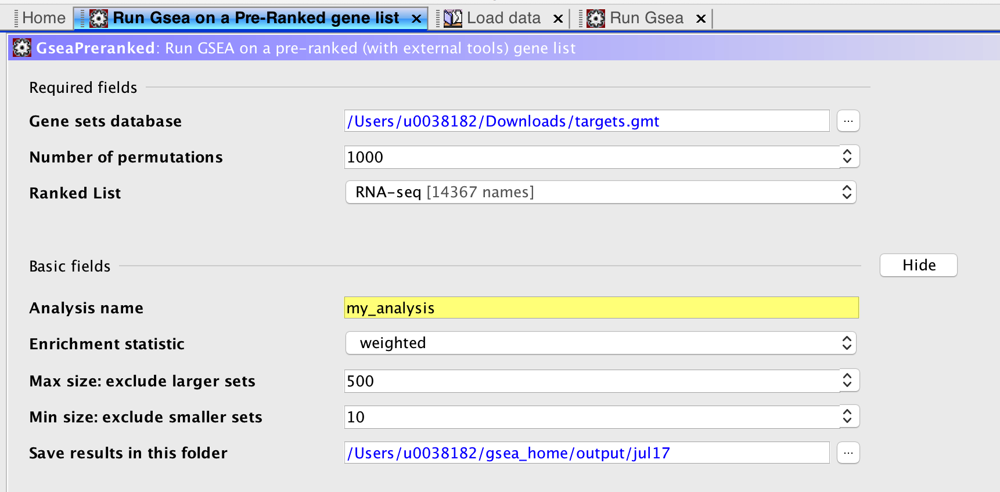

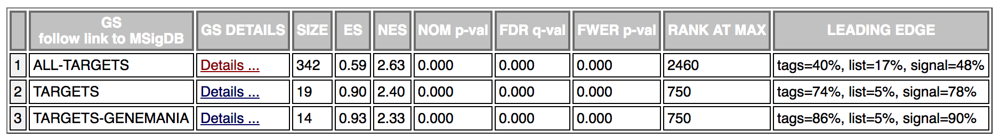

All three sets are significantly enriched in the top of the ranking (FDR<0.001)

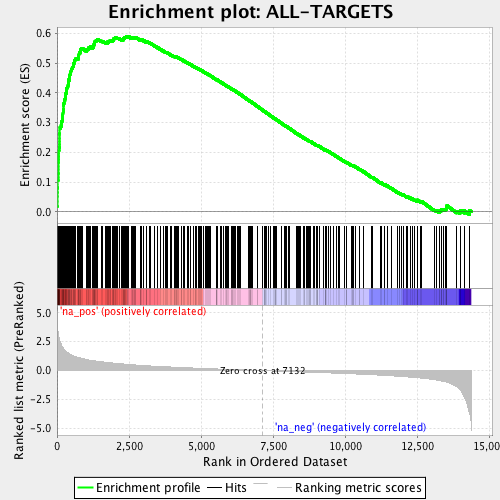

138 genes in the leading edge: high-confidence target genes of TP53.
We also observe that quite some genes with a ChIP-seq peak are not up-regulated in the RNA-seq data after nutlin-3a treatment. Either these are false positives ChIP-seq peaks, or the binding of TP53 at those locations is not functional, or the binding of TP53 does not lead to gene activation in this condition because other TFs repress those genes; or finally, the binding of TP53 may lead to gene activation, but the increased amounts of mRNA are degraded, resulting in similar steady-state levels in the RNA-seq data. To study these latter effects, we would need nascent RNA-seq (e.g., GRO-seq, PRO-seq, TT-seq, ..).

## Using only DIRECT peaks = peaks with the TP53 motif

Above, we had downloaded the "sites" from RSAT, leading to peaks with the motif. Above we created a BED file with those direct peaks.
Also, we had downloaded the leading edge from i-cisTarget, as a BED file.

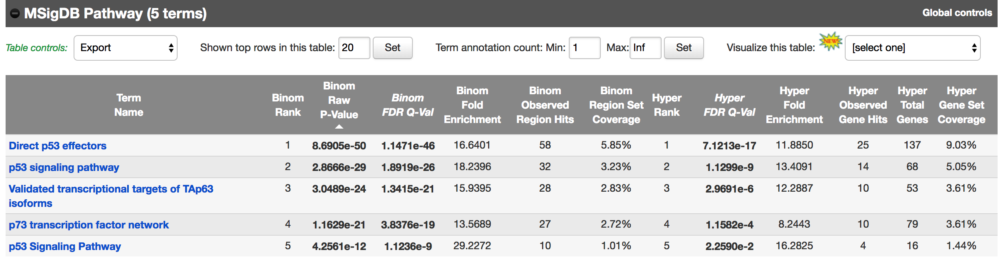

The enrichment is now much stronger !

You can repeat the GSEA analysis with the RNA-seq ranking using the direct peaks only.

In your project, if you find a good motif, with a strong enrichment like we do here, it is advisable to work mostly with the direct peaks.